# Optimasi Model Computer Vision untuk Deteksi Real-Time (CCTV): MobileNetV2 & YOLOv8n dengan OpenVINO dan Quantization INT8

Notebook ini fokus pada skenario deteksi objek real-time pada rekaman CCTV asli, sesuai penekanan materi di BAB 4 tentang real-time monitoring. Teknik-teknik optimasi yang dipelajari (quantization, multi-threading/multi-processing, trade-off ukuran gambar) semuanya diuji dan diukur pada skenario CCTV yang sama ini. Tiga video CCTV dipakai, masing-masing dengan lisensi yang jelas: traffic (MIT, `ahmetozlu/tensorflow_object_counting_api`), jalan multi-kelas orang/mobil/sepeda/motor (Pixabay License), dan video aerial (Mixkit Free License) yang sengaja dipakai sebagai uji kasus keterbatasan model.

Tahap pertama adalah instalasi seluruh library yang dibutuhkan.

Tahap kedua adalah menyiapkan dataset kalibrasi (COCO128) dan ketiga video CCTV, lalu mengambil satu frame yang konsisten dipakai sebagai gambar contoh di seluruh notebook ini.

Tahap ketiga adalah bagian klasifikasi gambar dengan MobileNetV2, mulai dari konversi model, inference dengan OpenCV, quantization INT8, sampai validasi konsistensi prediksi pada banyak gambar berbeda.

Tahap keempat adalah bagian deteksi objek dengan YOLOv8n, dengan alur yang serupa yaitu konversi, inference, quantization, ditambah validasi mAP sesungguhnya memakai fungsi `val()` bawaan Ultralytics.

Tahap kelima adalah eksperimen trade-off ukuran gambar, membuktikan langsung hubungan antara ukuran input, kecepatan, dan akurasi model.

Tahap keenam adalah ringkasan dan penjelasan tambahan seputar quantization.

Tahap ketujuh membahas pentingnya multi-threading dan multi-processing dalam efisiensi model AI.

Tahap kedelapan adalah ringkasan akhir menyeluruh yang menggabungkan ukuran, kecepatan, dan akurasi dari seluruh model dan tahap sebelumnya.

Tahap kesembilan adalah demo penerapan pada TIGA video CCTV secara utuh (traffic, jalan multi-kelas, dan uji kasus keterbatasan model pada sudut aerial), lengkap dengan penghitung FPS secara langsung dan momen-momen dengan objek terdeteksi terbanyak.


## Tahap 1, Instalasi Library

Sebelum mulai, kita perlu memasang beberapa library.

OpenVINO adalah toolkit dari Intel yang dipakai untuk menjalankan model deep learning secara efisien, terutama di CPU. OpenVINO juga menyediakan format model sendiri yang disebut IR, singkatan dari Intermediate Representation, yang terdiri dari dua file yaitu file XML untuk struktur model dan file BIN untuk bobot atau angka hasil training.

NNCF adalah singkatan dari Neural Network Compression Framework. Library ini yang akan kita pakai untuk melakukan quantization, yaitu proses mengubah angka pada model dari format 32 bit (FP32) menjadi format 8 bit (INT8), sehingga model menjadi lebih kecil dan lebih cepat, dengan sedikit penurunan akurasi yang biasanya masih bisa diterima.

Ultralytics adalah library resmi untuk YOLOv8, yang akan kita pakai untuk deteksi objek.

OpenCV kita pakai untuk semua proses pengolahan gambar, seperti membaca gambar, mengubah ukuran, mengubah warna, dan menggambar kotak hasil deteksi.

Proses instalasi di bawah ini menggunakan versi headless dari OpenCV, artinya versi OpenCV tanpa fitur tampilan jendela GUI, karena Colab berjalan di server tanpa layar sehingga fitur GUI tidak diperlukan dan hanya akan membuat instalasi menjadi lebih berat.


Catatan tambahan: rentang versi library di bawah ini sengaja dibuat fleksibel (bukan versi tunggal yang di-pin), karena environment Colab sering sudah punya beberapa dependency terpasang duluan. Supaya hasil notebook ini tetap bisa dilacak ulang, versi PERSIS yang benar-benar terpasang akan dicetak setelah instalasi selesai.

In [1]:
!pip install -q "openvino>=2024.0.0" "nncf>=2.9.0" "ultralytics>=8.1.0" "opencv-python-headless" "onnx" "onnxscript" "pandas" --upgrade

import openvino as ov
import nncf
import ultralytics
import cv2

print("Instalasi selesai. Versi library yang benar-benar terpasang pada environment ini:")
print("  OpenVINO   :", ov.__version__)
print("  NNCF       :", nncf.__version__)
print("  Ultralytics:", ultralytics.__version__)
print("  OpenCV     :", cv2.__version__)


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.7/46.7 kB 2.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 7.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.1/59.1 MB 26.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 797.3/797.3 kB 58.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 83.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.9/8.9 MB 144.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 754.2/754.2 kB 56.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.8/10.8 MB 106.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 183.4/183.4 kB 21.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 185.8/185.8 kB 21.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 343.2/343.2 kB 35.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.0/88.0 kB 9.8 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not c

In [2]:
import os
import cv2
import time
import glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import openvino as ov
import nncf

os.makedirs("models", exist_ok=True)
os.makedirs("data", exist_ok=True)

print("Semua library berhasil diimport dan siap dipakai.")


Semua library berhasil diimport dan siap dipakai.


### Fungsi Bantu Benchmark (dipakai konsisten di seluruh notebook)

Sebelum masuk ke tahap-tahap berikutnya, kita siapkan dulu satu fungsi benchmark yang akan dipakai di SETIAP pengukuran kecepatan pada notebook ini, baik untuk MobileNetV2 maupun YOLOv8n. Tujuannya supaya metodologi pengukurannya konsisten dan hasilnya adil untuk dibandingkan, alih-alih memakai cara pengukuran yang berbeda-beda di tiap bagian.

Fungsi ini melakukan tiga hal penting: pertama, melakukan beberapa kali run pemanasan (warm-up) yang tidak dihitung, karena inference pertama kali biasanya lebih lambat akibat inisialisasi cache dan alokasi memori. Kedua, mengukur waktu pada BEBERAPA gambar berbeda (bukan hanya 1 gambar yang diulang-ulang), supaya hasilnya lebih mewakili kondisi pemakaian nyata. Ketiga, mengulang tiap gambar beberapa kali supaya jumlah sampel waktu yang terkumpul lebih banyak, dan melaporkan rata-rata beserta standar deviasinya, bukan cuma satu angka tunggal.

In [3]:
def benchmark_compiled_model(compiled_model, list_of_inputs, n_warmup=5, n_repeats=3):
    """
    Fungsi benchmark standar yang dipakai di seluruh notebook ini.

    list_of_inputs : daftar tensor input yang sudah dipreprocess, idealnya diambil
                      dari beberapa gambar berbeda, bukan 1 gambar yang sama diulang.
    n_warmup        : jumlah run awal yang dibuang dari perhitungan.
    n_repeats       : setiap input di list_of_inputs dijalankan sebanyak ini.

    Mengembalikan dict berisi rata-rata, standar deviasi, nilai tercepat, nilai
    terlambat, dan jumlah total sampel waktu yang terkumpul.
    """
    for _ in range(n_warmup):
        compiled_model([list_of_inputs[0]])

    waktu_semua = []
    for inp in list_of_inputs:
        for _ in range(n_repeats):
            start = time.perf_counter()
            compiled_model([inp])
            waktu_semua.append((time.perf_counter() - start) * 1000)

    waktu_semua = np.array(waktu_semua)
    return {
        "mean_ms": float(waktu_semua.mean()),
        "std_ms": float(waktu_semua.std()),
        "min_ms": float(waktu_semua.min()),
        "max_ms": float(waktu_semua.max()),
        "n_samples": int(len(waktu_semua)),
    }


## Tahap 2, Menyiapkan Dataset Kecil

Untuk keperluan uji coba dan kalibrasi quantization, kita tidak memerlukan dataset besar seperti ImageNet penuh atau COCO penuh yang ukurannya bisa mencapai puluhan gigabyte.

Kita cukup memakai COCO128, yaitu potongan kecil dari dataset COCO yang hanya berisi 128 gambar saja. Ukurannya sangat kecil, sekitar 7 megabyte, sehingga proses download hanya butuh beberapa detik.

Dataset ini akan dipakai untuk dua keperluan.

Keperluan pertama adalah sebagai gambar contoh untuk menguji hasil inference model, baik sebelum maupun sesudah quantization.

Keperluan kedua adalah sebagai dataset kalibrasi untuk proses quantization. Proses kalibrasi ini tidak memerlukan label atau anotasi, model hanya perlu melihat sejumlah contoh gambar asli agar NNCF bisa menghitung rentang nilai yang tepat saat mengubah angka dari FP32 menjadi INT8.


In [4]:
import zipfile, urllib.request

coco128_url = "https://ultralytics.com/assets/coco128.zip"
zip_path = "data/coco128.zip"

if not os.path.exists("data/coco128"):
    urllib.request.urlretrieve(coco128_url, zip_path)
    with zipfile.ZipFile(zip_path, "r") as z:
        z.extractall("data")
    print("Dataset COCO128 berhasil diunduh dan diekstrak.")
else:
    print("Dataset COCO128 sudah tersedia, tidak perlu download ulang.")

image_dir = "data/coco128/images/train2017"
all_images = sorted(glob.glob(os.path.join(image_dir, "*.jpg")))
print("Jumlah gambar yang tersedia adalah", len(all_images))
print("Dataset ini dipakai untuk kalibrasi quantization dan pengujian pada banyak gambar sekaligus")
print("(Tahap 3.6, 3.7, 4.6) -- isinya sengaja acak dan bervariasi untuk keperluan itu.")


Dataset COCO128 berhasil diunduh dan diekstrak.
Jumlah gambar yang tersedia adalah 128
Dataset ini dipakai untuk kalibrasi quantization dan pengujian pada banyak gambar sekaligus
(Tahap 3.6, 3.7, 4.6) -- isinya sengaja acak dan bervariasi untuk keperluan itu.


### Menyiapkan Video-Video CCTV yang Dipakai di Seluruh Notebook

Notebook ini memakai TIGA video CCTV/pengawasan asli, masing-masing dari sumber dengan lisensi yang jelas untuk dipakai ulang:

1. **Traffic** (`vehicle_survaillance.mp4`) -- CCTV lalu lintas kendaraan, dari repo riset publik [`ahmetozlu/tensorflow_object_counting_api`](https://github.com/ahmetozlu/tensorflow_object_counting_api) (lisensi MIT), diunduh otomatis
2. **Jalan** (`1.mp4`) -- rekaman jalan berisi orang, mobil, sepeda, DAN motor sekaligus, dari [Pixabay](https://pixabay.com/id/videos/jalan-lalu-lintas-rakyat-perkotaan-86656/) (Pixabay License, bebas komersial tanpa atribusi wajib) -- diupload manual di sel berikutnya
3. **Aerial** (video roundabout) -- dari Mixkit (Mixkit Free License) -- diupload manual juga, dipakai nanti di Tahap 9 sebagai uji kasus keterbatasan model

Satu frame dari video Jalan (yang paling lengkap kelasnya) dipakai sebagai gambar contoh konsisten di Tahap 3 dan 4.

Video traffic berhasil diunduh.
Silakan upload 2 file video sekaligus (drag & drop keduanya):
 1. Video jalan dari Pixabay (nama file: 1.mp4)
 2. Video roundabout dari Mixkit (nama file mengandung 'mixkit')


Saving 1.mp4 to 1.mp4
Saving mixkit-roundabout-aerial-view-14802-hd-ready.mp4 to mixkit-roundabout-aerial-view-14802-hd-ready.mp4
Kedua video berhasil disiapkan.
Gambar contoh diambil dari frame ke-0 video jalan, dan akan dipakai berulang di Tahap 3 dan 4.


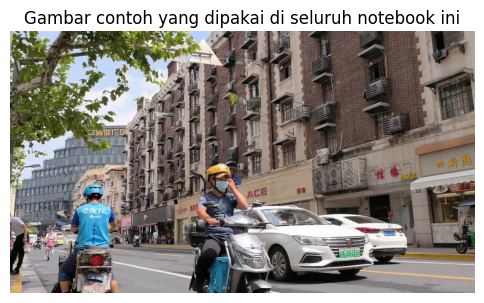

In [5]:
import shutil
from ultralytics import YOLO

# Video traffic -- diunduh otomatis (lisensi MIT)
TRAFFIC_VIDEO_URL = "https://raw.githubusercontent.com/ahmetozlu/tensorflow_object_counting_api/master/input_images_and_videos/vehicle_survaillance.mp4"
TRAFFIC_VIDEO_PATH = "data/vehicle_survaillance.mp4"
if not os.path.exists(TRAFFIC_VIDEO_PATH):
    urllib.request.urlretrieve(TRAFFIC_VIDEO_URL, TRAFFIC_VIDEO_PATH)
    print("Video traffic berhasil diunduh.")
else:
    print("Video traffic sudah tersedia.")

# Video jalan (Pixabay) dan video aerial (Mixkit) -- perlu diupload manual karena
# kedua situs ini tidak menyediakan URL unduh langsung yang stabil untuk dipakai di kode
STREET_VIDEO_PATH = "data/street_pixabay.mp4"
AERIAL_VIDEO_PATH = "data/aerial_mixkit.mp4"

if not (os.path.exists(STREET_VIDEO_PATH) and os.path.exists(AERIAL_VIDEO_PATH)):
    print("Silakan upload 2 file video sekaligus (drag & drop keduanya):")
    print(" 1. Video jalan dari Pixabay (nama file: 1.mp4)")
    print(" 2. Video roundabout dari Mixkit (nama file mengandung 'mixkit')")
    from google.colab import files
    uploaded = files.upload()
    for fname in uploaded.keys():
        tujuan = AERIAL_VIDEO_PATH if "mixkit" in fname.lower() else STREET_VIDEO_PATH
        shutil.move(fname, tujuan)
    print("Kedua video berhasil disiapkan.")
else:
    print("Kedua video sudah tersedia.")

# Model YOLOv8n biasa (dipakai lagi nanti di Tahap 4.1 untuk konversi ke OpenVINO)
yolo_model = YOLO("yolov8n.pt")

# Mencari frame pertama pada video jalan yang sudah pasti mengandung sesuatu yang
# terdeteksi, supaya gambar contoh yang dipakai berulang di notebook ini jelas relevan.
cap_probe = cv2.VideoCapture(STREET_VIDEO_PATH)
img_bgr = None
sample_image_path = "data/sample_frame.jpg"
frame_no = 0
while True:
    ret, frame = cap_probe.read()
    if not ret:
        break
    hasil_probe = yolo_model.predict(frame, device="cpu", verbose=False)[0]
    if len(hasil_probe.boxes) > 0:
        img_bgr = frame
        break
    frame_no += 1
cap_probe.release()

if img_bgr is None:
    cap_probe = cv2.VideoCapture(STREET_VIDEO_PATH)
    ret, img_bgr = cap_probe.read()
    cap_probe.release()
    print("Catatan: tidak ada frame dengan deteksi ditemukan, memakai frame pertama sebagai cadangan.")

cv2.imwrite(sample_image_path, img_bgr)
print(f"Gambar contoh diambil dari frame ke-{frame_no} video jalan, dan akan dipakai berulang di Tahap 3 dan 4.")

plt.figure(figsize=(6, 4))
plt.imshow(cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB))
plt.title("Gambar contoh yang dipakai di seluruh notebook ini")
plt.axis("off")
plt.show()


## Tahap 3, Klasifikasi Gambar dengan MobileNetV2

MobileNetV2 dipilih karena termasuk model klasifikasi gambar paling ringan yang tersedia secara publik. Model ini didesain khusus untuk perangkat dengan sumber daya terbatas seperti ponsel, sehingga sangat cocok untuk contoh notebook yang ringan seperti ini.

Alur yang akan kita lakukan pada bagian ini adalah sebagai berikut. Pertama kita ambil model MobileNetV2 yang sudah dilatih sebelumnya (istilahnya pretrained) menggunakan dataset ImageNet, yang berisi 1000 kategori objek. Kedua kita ubah model tersebut ke format ONNX. Ketiga kita konversi dari ONNX ke format OpenVINO IR. Keempat kita jalankan inference menggunakan OpenCV untuk pengolahan gambarnya. Kelima kita lakukan quantization ke INT8. Keenam kita bandingkan hasil sebelum dan sesudah quantization.


### 3.1 Mengambil Model dan Mengubahnya ke ONNX

ONNX adalah format model yang bersifat universal, artinya bisa dibaca oleh banyak framework berbeda. Kita memakai ONNX sebagai jembatan atau perantara sebelum masuk ke format OpenVINO, karena OpenVINO memiliki dukungan konversi yang sangat baik dari format ONNX.

Kode di bawah ini mengambil model MobileNetV2 dari library torchvision, lalu mengubahnya ke format ONNX menggunakan fungsi bawaan dari PyTorch.


In [6]:
import torch
import torchvision.models as models

mobilenet = models.mobilenet_v2(weights=models.MobileNet_V2_Weights.IMAGENET1K_V2)
mobilenet.eval()

dummy_input = torch.randn(1, 3, 224, 224)
onnx_path = "models/mobilenetv2.onnx"

# Catatan: mulai PyTorch versi baru, torch.onnx.export secara default memakai
# exporter baru berbasis dynamo yang membutuhkan library onnxscript.
# Kita set dynamo=False agar memakai exporter versi lama yang lebih stabil
# dan tidak memerlukan library tambahan tersebut.
torch.onnx.export(
    mobilenet,
    dummy_input,
    onnx_path,
    input_names=["input"],
    output_names=["output"],
    opset_version=13,
    dynamo=False,
)

print("Model MobileNetV2 berhasil diubah ke format ONNX dan disimpan di", onnx_path)


Downloading: "https://download.pytorch.org/models/mobilenet_v2-7ebf99e0.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v2-7ebf99e0.pth


100%|██████████| 13.6M/13.6M [00:00<00:00, 86.6MB/s]
/tmp/ipykernel_1019/4257526198.py:14: DeprecationWarning: You are using the legacy TorchScript-based ONNX export. Starting in PyTorch 2.9, the new torch.export-based ONNX exporter has become the default. Learn more about the new export logic: https://docs.pytorch.org/docs/stable/onnx_export.html. For exporting control flow: https://pytorch.org/tutorials/beginner/onnx/export_control_flow_model_to_onnx_tutorial.html
  torch.onnx.export(


Model MobileNetV2 berhasil diubah ke format ONNX dan disimpan di models/mobilenetv2.onnx


### 3.2 Konversi dari ONNX ke Format OpenVINO IR

Format IR terdiri dari file XML dan file BIN. File XML berisi struktur atau susunan lapisan pada model, sedangkan file BIN berisi angka bobot hasil training. Format ini adalah format asli yang bisa langsung dijalankan oleh OpenVINO Runtime dengan performa terbaik.


In [7]:
ov_model_mobilenet = ov.convert_model(onnx_path)
ov.save_model(ov_model_mobilenet, "models/mobilenetv2_fp32.xml")

print("Konversi ke format OpenVINO IR selesai.")
print("File yang dihasilkan adalah models/mobilenetv2_fp32.xml dan models/mobilenetv2_fp32.bin")


Konversi ke format OpenVINO IR selesai.
File yang dihasilkan adalah models/mobilenetv2_fp32.xml dan models/mobilenetv2_fp32.bin


### 3.3 Inference Menggunakan OpenCV

Sebelum gambar bisa dimasukkan ke model, gambar harus melalui proses persiapan yang disebut preprocessing. Untuk model klasifikasi seperti MobileNetV2, langkah preprocessing yang umum dipakai adalah sebagai berikut.

Langkah pertama adalah mengubah ukuran gambar menjadi 224 kali 224 piksel, karena itulah ukuran yang diharapkan oleh model.

Langkah kedua adalah mengubah urutan warna dari BGR ke RGB, karena OpenCV secara default membaca gambar dengan urutan warna BGR, sedangkan model dilatih menggunakan urutan RGB.

Langkah ketiga adalah normalisasi, yaitu mengubah nilai piksel dari rentang 0 sampai 255 menjadi rentang yang lebih kecil, kemudian dikurangi dengan nilai rata-rata dan dibagi dengan nilai standar deviasi dari dataset ImageNet.

Langkah keempat adalah mengubah susunan dimensi dari format HWC, yaitu tinggi lebar dan channel warna, menjadi format CHW, yaitu channel warna lalu tinggi dan lebar, karena begitulah cara model deep learning umumnya menerima input gambar.


In [8]:
IMAGENET_MEAN = np.array([0.485, 0.456, 0.406], dtype=np.float32)
IMAGENET_STD  = np.array([0.229, 0.224, 0.225], dtype=np.float32)

def preprocess_classification(img_bgr, size=224):
    img = cv2.resize(img_bgr, (size, size), interpolation=cv2.INTER_LINEAR)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB).astype(np.float32) / 255.0
    img = (img - IMAGENET_MEAN) / IMAGENET_STD
    img = img.transpose(2, 0, 1)
    img = np.expand_dims(img, 0)
    return img.astype(np.float32)

core = ov.Core()
model_mobilenet_fp32 = core.read_model("models/mobilenetv2_fp32.xml")
compiled_mobilenet_fp32 = core.compile_model(model_mobilenet_fp32, "CPU")
output_layer = compiled_mobilenet_fp32.output(0)

import json as _json
labels_url = "https://raw.githubusercontent.com/anishathalye/imagenet-simple-labels/master/imagenet-simple-labels.json"
labels_path = "data/imagenet_labels.json"
if not os.path.exists(labels_path):
    urllib.request.urlretrieve(labels_url, labels_path)
with open(labels_path) as f:
    imagenet_labels = _json.load(f)

def run_classification(compiled_model, img_bgr):
    output_layer_local = compiled_model.output(0)
    inp = preprocess_classification(img_bgr)
    result = compiled_model([inp])[output_layer_local]
    probs = result[0]
    top1 = int(np.argmax(probs))
    return imagenet_labels[top1], float(probs[top1])

print("Fungsi preprocessing dan inference untuk MobileNetV2 siap dipakai.")


Fungsi preprocessing dan inference untuk MobileNetV2 siap dipakai.


In [9]:
label, score = run_classification(compiled_mobilenet_fp32, img_bgr)
print("Hasil prediksi model FP32 adalah kelas", label, "dengan skor mentah", round(score, 3))


Hasil prediksi model FP32 adalah kelas taxicab dengan skor mentah 5.361


### 3.4 Quantization ke INT8 dengan NNCF

Sekarang kita masuk ke bagian utama, yaitu quantization. Proses ini disebut Post Training Quantization, artinya proses kuantisasi dilakukan setelah model selesai dilatih, tanpa perlu melatih ulang model dari awal.

Cara kerjanya adalah NNCF akan menjalankan model FP32 menggunakan beberapa contoh gambar dari dataset kalibrasi, kemudian mengamati rentang nilai yang muncul pada setiap lapisan model. Dari rentang nilai tersebut, NNCF menentukan cara terbaik untuk membulatkan angka FP32 menjadi angka INT8 dengan penurunan akurasi seminimal mungkin.

Karena ini adalah notebook versi ringan, kita hanya memakai 60 gambar untuk kalibrasi, jumlah ini sudah cukup untuk model klasifikasi sederhana seperti MobileNetV2 pada tahap belajar atau uji coba. Untuk keperluan produksi yang lebih serius, jumlah sampel kalibrasi yang disarankan adalah 100 sampai 300 gambar.


In [10]:
calibration_images = all_images[:60]

def classification_transform_fn(image_path):
    img_bgr = cv2.imread(image_path)
    return preprocess_classification(img_bgr)

calibration_dataset_mobilenet = nncf.Dataset(
    calibration_images,
    transform_func=classification_transform_fn
)

print("Proses quantization sedang berjalan, mohon tunggu sebentar.")
quantized_mobilenet = nncf.quantize(
    model_mobilenet_fp32,
    calibration_dataset_mobilenet,
    preset=nncf.QuantizationPreset.MIXED,
    subset_size=60,
)

ov.save_model(quantized_mobilenet, "models/mobilenetv2_int8.xml")
print("Proses quantization selesai. Model INT8 disimpan di models/mobilenetv2_int8.xml")


Proses quantization sedang berjalan, mohon tunggu sebentar.


Output()

Output()

Proses quantization selesai. Model INT8 disimpan di models/mobilenetv2_int8.xml


### 3.5 Membandingkan Model FP32 dan INT8

Setelah quantization selesai, kita perlu memastikan bahwa model INT8 masih memberikan hasil prediksi yang masuk akal, dan mengukur seberapa besar penghematan yang didapat dari sisi ukuran file dan kecepatan.


In [11]:
compiled_mobilenet_int8 = core.compile_model(quantized_mobilenet, "CPU")

label_fp32, score_fp32 = run_classification(compiled_mobilenet_fp32, img_bgr)
label_int8, score_int8 = run_classification(compiled_mobilenet_int8, img_bgr)

print("Prediksi model FP32 adalah", label_fp32, "dengan skor", round(score_fp32, 3))
print("Prediksi model INT8 adalah", label_int8, "dengan skor", round(score_int8, 3))

size_fp32 = os.path.getsize("models/mobilenetv2_fp32.bin") / (1024**2)
size_int8 = os.path.getsize("models/mobilenetv2_int8.bin") / (1024**2)
print("Ukuran file bobot model FP32 adalah", round(size_fp32, 2), "megabyte")
print("Ukuran file bobot model INT8 adalah", round(size_int8, 2), "megabyte")
print("Model INT8 lebih kecil sebanyak", round(size_fp32 / size_int8, 2), "kali dibanding model FP32")

# Benchmark memakai fungsi bersama, dengan 15 gambar berbeda dari COCO128 (bukan 1 gambar diulang)
benchmark_images_mobilenet = [preprocess_classification(cv2.imread(p)) for p in all_images[:15]]

hasil_bench_mobilenet_fp32 = benchmark_compiled_model(compiled_mobilenet_fp32, benchmark_images_mobilenet)
hasil_bench_mobilenet_int8 = benchmark_compiled_model(compiled_mobilenet_int8, benchmark_images_mobilenet)

print(f"\nKecepatan model FP32: {hasil_bench_mobilenet_fp32['mean_ms']:.2f} \u00b1 {hasil_bench_mobilenet_fp32['std_ms']:.2f} ms ({hasil_bench_mobilenet_fp32['n_samples']} sampel)")
print(f"Kecepatan model INT8: {hasil_bench_mobilenet_int8['mean_ms']:.2f} \u00b1 {hasil_bench_mobilenet_int8['std_ms']:.2f} ms ({hasil_bench_mobilenet_int8['n_samples']} sampel)")
print(f"Model INT8 lebih cepat sebanyak {hasil_bench_mobilenet_fp32['mean_ms']/hasil_bench_mobilenet_int8['mean_ms']:.2f} kali dibanding model FP32 (dihitung dari {hasil_bench_mobilenet_fp32['n_samples']} pengukuran, bukan 1 kali run)")


Prediksi model FP32 adalah taxicab dengan skor 5.361
Prediksi model INT8 adalah taxicab dengan skor 5.039
Ukuran file bobot model FP32 adalah 6.65 megabyte
Ukuran file bobot model INT8 adalah 3.46 megabyte
Model INT8 lebih kecil sebanyak 1.92 kali dibanding model FP32

Kecepatan model FP32: 2.39 ± 0.05 ms (45 sampel)
Kecepatan model INT8: 1.75 ± 0.08 ms (45 sampel)
Model INT8 lebih cepat sebanyak 1.37 kali dibanding model FP32 (dihitung dari 45 pengukuran, bukan 1 kali run)


### 3.6 Validasi Konsistensi Prediksi pada Banyak Gambar

Perbandingan pada 3.5 di atas hanya melihat 1 gambar contoh, yang belum cukup untuk menyimpulkan seberapa besar dampak quantization terhadap keputusan model secara umum. Perlu dicatat bahwa gambar-gambar di COCO128 ini tidak punya label ImageNet asli, sehingga "akurasi" MobileNetV2 dalam arti sebenarnya tidak bisa dihitung langsung di sini. Yang bisa dan lebih jujur untuk diukur adalah tingkat kesepakatan prediksi (prediction agreement), yaitu seberapa sering prediksi Top-1 model INT8 sama persis dengan prediksi Top-1 model FP32, pada sejumlah gambar berbeda.

In [12]:
n_validasi = 40
validasi_images = all_images[:n_validasi]

agree = 0
mismatch_examples = []
for path in validasi_images:
    img = cv2.imread(path)
    label_fp32_i, _ = run_classification(compiled_mobilenet_fp32, img)
    label_int8_i, _ = run_classification(compiled_mobilenet_int8, img)
    if label_fp32_i == label_int8_i:
        agree += 1
    else:
        mismatch_examples.append((path, label_fp32_i, label_int8_i))

agreement_rate = agree / len(validasi_images) * 100
print(f"Diuji pada {len(validasi_images)} gambar berbeda dari COCO128.")
print(f"Prediksi Top-1 FP32 dan INT8 sama pada {agree} dari {len(validasi_images)} gambar ({agreement_rate:.1f}%).")

if mismatch_examples:
    print(f"\nContoh gambar yang prediksinya berbeda ({len(mismatch_examples)} kasus):")
    for p, lf, li in mismatch_examples[:5]:
        print(f"  {os.path.basename(p)}: FP32='{lf}' vs INT8='{li}'")
else:
    print("\nTidak ada perbedaan prediksi sama sekali pada gambar-gambar yang diuji.")


Diuji pada 40 gambar berbeda dari COCO128.
Prediksi Top-1 FP32 dan INT8 sama pada 37 dari 40 gambar (92.5%).

Contoh gambar yang prediksinya berbeda (3 kasus):
  000000000025.jpg: FP32='split-rail fence' vs INT8='great grey owl'
  000000000094.jpg: FP32='traffic sign' vs INT8='tram'
  000000000164.jpg: FP32='medicine chest' vs INT8='microwave oven'


### 3.7 Perbandingan Visual pada Beberapa Gambar

Sebagai pelengkap angka-angka di atas, berikut perbandingan visual prediksi FP32 dan INT8 pada beberapa gambar berbeda sekaligus, bukan hanya 1 gambar seperti sebelumnya.

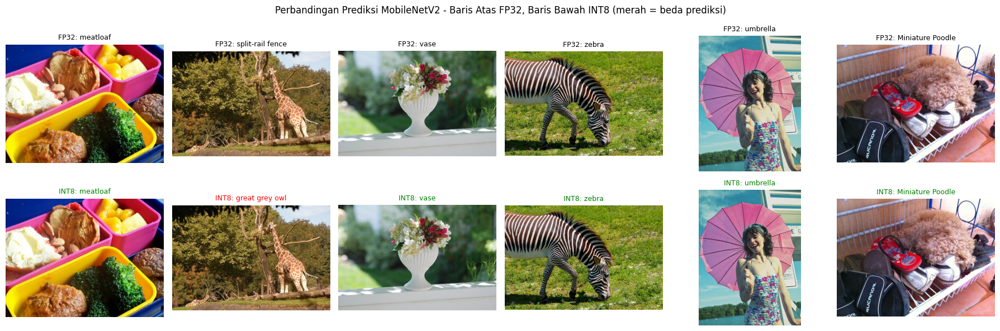

In [13]:
n_grid = 6
grid_images = all_images[:n_grid]

fig, axes = plt.subplots(2, n_grid, figsize=(3 * n_grid, 6))
for i, path in enumerate(grid_images):
    img = cv2.imread(path)
    label_f, score_f = run_classification(compiled_mobilenet_fp32, img)
    label_i, score_i = run_classification(compiled_mobilenet_int8, img)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    axes[0, i].imshow(img_rgb)
    axes[0, i].set_title(f"FP32: {label_f}", fontsize=9)
    axes[0, i].axis("off")

    warna_judul = "green" if label_f == label_i else "red"
    axes[1, i].imshow(img_rgb)
    axes[1, i].set_title(f"INT8: {label_i}", fontsize=9, color=warna_judul)
    axes[1, i].axis("off")

plt.suptitle("Perbandingan Prediksi MobileNetV2 - Baris Atas FP32, Baris Bawah INT8 (merah = beda prediksi)")
plt.tight_layout()
plt.show()


## Tahap 4, Deteksi Objek dengan YOLOv8n

YOLOv8n adalah versi paling ringan dari keluarga YOLOv8, huruf n di belakang nama model adalah singkatan dari nano. Model ini hanya memiliki sekitar 3 juta parameter, jauh lebih kecil dibanding versi YOLOv8 lainnya seperti small, medium, large, atau extra large.

Alur yang akan kita lakukan pada bagian ini sedikit berbeda dengan bagian klasifikasi. Ultralytics sudah menyediakan fungsi export yang bisa langsung mengubah model ke format OpenVINO IR tanpa perlu melalui ONNX secara manual, sehingga langkahnya menjadi lebih singkat.

Untuk bagian inference, kita akan menulis sendiri proses preprocessing dan postprocessing menggunakan OpenCV, agar terlihat jelas apa yang sebenarnya terjadi di balik layar, bukan hanya memanggil fungsi otomatis dari Ultralytics.


### 4.1 Mengambil Model dan Mengubahnya ke Format OpenVINO

Model `yolo_model` (YOLOv8n bawaan Ultralytics) sudah dimuat sebelumnya di Tahap 2, saat mencari gambar contoh yang konsisten untuk notebook ini. Di sini kita tinggal mengonversinya ke format OpenVINO IR.

Fungsi `export` dengan parameter `format="openvino"` akan mengubah model tersebut langsung menjadi format IR, tanpa kita perlu menulis kode konversi secara manual seperti pada bagian MobileNetV2 sebelumnya.

In [14]:
yolo_model.export(format="openvino", imgsz=640, dynamic=False, half=False)

yolo_ov_dir = "yolov8n_openvino_model"
print("Model berhasil diexport. Isi folder hasil export adalah", os.listdir(yolo_ov_dir))


WARNING ⚠️ 'half' is deprecated and will be removed in the future. Use 'quantize' instead.
Ultralytics 8.4.157 🚀 Python-3.13.15 torch-2.11.0+cu128 CPU (Intel Xeon CPU @ 2.20GHz)
💡 ProTip: Export to OpenVINO format for best performance on Intel hardware. Learn more at https://docs.ultralytics.com/integrations/openvino
YOLOv8n summary (fused): 72 layers, 3,151,904 parameters, 0 gradients, 8.7 GFLOPs

PyTorch: starting from 'yolov8n.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 84, 8400) (6.2 MB)

OpenVINO: starting export with openvino 2026.4.0-22959-99c81491cc3-releases/2026/4...
OpenVINO: export success ✅ 1.5s, saved as 'yolov8n_openvino_model/' (12.3 MB)

Export complete (1.8s)
Results saved to /content/yolov8n_openvino_model
Predict:         yolo predict task=detect model=yolov8n_openvino_model/ imgsz=640 
Validate:        yolo val task=detect model=yolov8n_openvino_model/ imgsz=640 data=coco.yaml  
Visualize:       https://netron.app
Model berhasil diexport. Isi

### 4.2 Inference Menggunakan OpenCV

Proses preprocessing untuk model deteksi objek sedikit berbeda dengan model klasifikasi. Pada model deteksi, kita memakai teknik yang disebut letterbox, yaitu mengubah ukuran gambar sambil tetap mempertahankan rasio aslinya, kemudian menambahkan warna abu-abu di bagian yang kosong agar ukuran akhir tetap 640 kali 640 piksel. Teknik ini dipakai supaya objek pada gambar tidak berubah bentuk atau menjadi gepeng akibat perubahan ukuran yang memaksa.

Setelah gambar melewati model, hasil keluaran model masih berupa angka mentah yang perlu diproses lebih lanjut. Proses ini disebut postprocessing, yang terdiri dari beberapa langkah.

Langkah pertama adalah menyaring hasil yang memiliki tingkat keyakinan atau confidence di bawah ambang batas tertentu, karena hasil dengan keyakinan rendah biasanya bukan deteksi yang benar.

Langkah kedua adalah menerapkan Non Max Suppression, disingkat NMS, yaitu proses menghilangkan kotak deteksi yang saling tumpang tindih pada objek yang sama, sehingga satu objek hanya memiliki satu kotak deteksi saja, bukan berlapis-lapis.

Langkah ketiga adalah mengembalikan koordinat kotak deteksi dari ukuran gambar letterbox 640 kali 640 piksel kembali ke ukuran gambar aslinya, agar kotak deteksi digambar pada posisi yang tepat.


In [15]:
COCO_CLASSES = yolo_model.names

core = ov.Core()
yolo_model_fp32 = core.read_model(f"{yolo_ov_dir}/yolov8n.xml")
compiled_yolo_fp32 = core.compile_model(yolo_model_fp32, "CPU")
yolo_output_layer = compiled_yolo_fp32.output(0)

def letterbox(img, new_shape=(640, 640), color=(114, 114, 114)):
    h, w = img.shape[:2]
    scale = min(new_shape[0] / h, new_shape[1] / w)
    nh, nw = int(round(h * scale)), int(round(w * scale))
    resized = cv2.resize(img, (nw, nh), interpolation=cv2.INTER_LINEAR)
    pad_h, pad_w = new_shape[0] - nh, new_shape[1] - nw
    top, bottom = pad_h // 2, pad_h - pad_h // 2
    left, right = pad_w // 2, pad_w - pad_w // 2
    padded = cv2.copyMakeBorder(resized, top, bottom, left, right, cv2.BORDER_CONSTANT, value=color)
    return padded, scale, left, top

def preprocess_yolo(img_bgr, size=640):
    padded, scale, pad_x, pad_y = letterbox(img_bgr, (size, size))
    img = cv2.cvtColor(padded, cv2.COLOR_BGR2RGB).astype(np.float32) / 255.0
    img = img.transpose(2, 0, 1)
    img = np.expand_dims(img, 0)
    return img.astype(np.float32), scale, pad_x, pad_y

def postprocess_yolo(output, scale, pad_x, pad_y, orig_shape, conf_thres=0.25, iou_thres=0.45):
    preds = np.squeeze(output).T
    boxes_xywh = preds[:, :4]
    scores_all = preds[:, 4:]
    class_ids = np.argmax(scores_all, axis=1)
    scores = np.max(scores_all, axis=1)

    mask = scores > conf_thres
    boxes_xywh, scores, class_ids = boxes_xywh[mask], scores[mask], class_ids[mask]
    if len(boxes_xywh) == 0:
        return [], [], []

    x, y, w, h = boxes_xywh[:, 0], boxes_xywh[:, 1], boxes_xywh[:, 2], boxes_xywh[:, 3]
    x1, y1 = x - w / 2, y - h / 2
    boxes_xyxy = np.stack([x1, y1, w, h], axis=1)

    indices = cv2.dnn.NMSBoxes(boxes_xyxy.tolist(), scores.tolist(), conf_thres, iou_thres)
    indices = np.array(indices).flatten() if len(indices) > 0 else []

    final_boxes, final_scores, final_classes = [], [], []
    H, W = orig_shape[:2]
    for i in indices:
        bx, by, bw, bh = boxes_xyxy[i]
        bx = (bx - pad_x) / scale
        by = (by - pad_y) / scale
        bw = bw / scale
        bh = bh / scale
        bx, by = max(0, bx), max(0, by)
        bw, bh = min(bw, W - bx), min(bh, H - by)
        final_boxes.append([int(bx), int(by), int(bw), int(bh)])
        final_scores.append(float(scores[i]))
        final_classes.append(int(class_ids[i]))
    return final_boxes, final_scores, final_classes

def run_yolo_inference(compiled_model, img_bgr, conf_thres=0.25, iou_thres=0.45):
    output_layer_local = compiled_model.output(0)
    inp, scale, pad_x, pad_y = preprocess_yolo(img_bgr)
    output = compiled_model([inp])[output_layer_local]
    return postprocess_yolo(output, scale, pad_x, pad_y, img_bgr.shape, conf_thres, iou_thres)

def draw_detections(img_bgr, boxes, scores, class_ids):
    out = img_bgr.copy()
    for (x, y, w, h), score, cid in zip(boxes, scores, class_ids):
        cv2.rectangle(out, (x, y), (x + w, y + h), (0, 255, 0), 2)
        label = f"{COCO_CLASSES[cid]} {score:.2f}"
        cv2.putText(out, label, (x, max(y - 5, 0)), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
    return out

print("Fungsi preprocessing, inference, dan visualisasi untuk YOLOv8n siap dipakai.")


Fungsi preprocessing, inference, dan visualisasi untuk YOLOv8n siap dipakai.


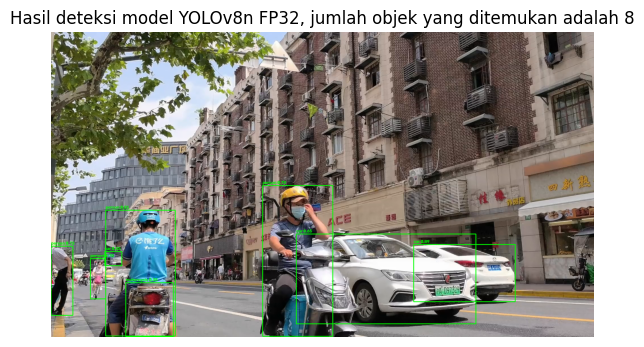

In [16]:
boxes, scores, class_ids = run_yolo_inference(compiled_yolo_fp32, img_bgr)
result_img = draw_detections(img_bgr, boxes, scores, class_ids)

plt.figure(figsize=(7, 7))
plt.imshow(cv2.cvtColor(result_img, cv2.COLOR_BGR2RGB))
plt.title("Hasil deteksi model YOLOv8n FP32, jumlah objek yang ditemukan adalah " + str(len(boxes)))
plt.axis("off")
plt.show()


### 4.3 Quantization ke INT8 untuk Model YOLOv8n

Prosesnya sama persis seperti pada bagian MobileNetV2, hanya saja fungsi transform yang dipakai disesuaikan dengan proses letterbox milik YOLO, bukan proses resize sederhana seperti pada model klasifikasi.

Kita memakai 80 gambar untuk kalibrasi pada bagian ini. Model deteksi objek umumnya membutuhkan sedikit lebih banyak sampel kalibrasi dibanding model klasifikasi, karena model deteksi memiliki lebih banyak keluaran yang perlu dikalibrasi, yaitu posisi kotak, ukuran kotak, dan kelas objek sekaligus.


In [17]:
calibration_images_yolo = all_images[:80]

def yolo_transform_fn(image_path):
    img = cv2.imread(image_path)
    inp, _, _, _ = preprocess_yolo(img)
    return inp

calibration_dataset_yolo = nncf.Dataset(
    calibration_images_yolo,
    transform_func=yolo_transform_fn
)

print("Proses quantization untuk YOLOv8n sedang berjalan, mohon tunggu sebentar.")
quantized_yolo = nncf.quantize(
    yolo_model_fp32,
    calibration_dataset_yolo,
    preset=nncf.QuantizationPreset.MIXED,
    subset_size=80,
)

ov.save_model(quantized_yolo, f"{yolo_ov_dir}/yolov8n_int8.xml")
print("Proses quantization selesai. Model INT8 disimpan di folder", yolo_ov_dir)


Proses quantization untuk YOLOv8n sedang berjalan, mohon tunggu sebentar.


Output()

Output()

Proses quantization selesai. Model INT8 disimpan di folder yolov8n_openvino_model


### 4.4 Membandingkan Deteksi dan Kecepatan Model FP32 dan INT8

Pada bagian ini kita akan menampilkan dua gambar hasil deteksi secara berdampingan, satu dari model FP32 dan satu dari model INT8, agar perbedaannya bisa dilihat secara langsung. Kita juga akan mengukur perbedaan kecepatan dan ukuran file antara kedua model tersebut.


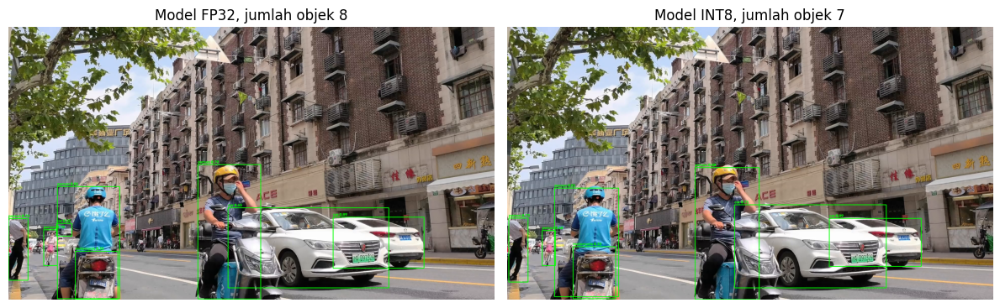

Ukuran file model FP32 adalah 12.12 megabyte
Ukuran file model INT8 adalah 3.14 megabyte
Model INT8 lebih kecil sebanyak 3.86 kali dibanding model FP32

Kecepatan model FP32: 22.86 ± 3.44 ms (45 sampel)
Kecepatan model INT8: 14.60 ± 0.55 ms (45 sampel)
Model INT8 lebih cepat sebanyak 1.57 kali dibanding model FP32 (dihitung dari 45 pengukuran, bukan 1 kali run)


In [18]:
compiled_yolo_int8 = core.compile_model(quantized_yolo, "CPU")

boxes_i8, scores_i8, classes_i8 = run_yolo_inference(compiled_yolo_int8, img_bgr)
result_img_int8 = draw_detections(img_bgr, boxes_i8, scores_i8, classes_i8)

fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].imshow(cv2.cvtColor(result_img, cv2.COLOR_BGR2RGB))
axes[0].set_title("Model FP32, jumlah objek " + str(len(boxes)))
axes[0].axis("off")
axes[1].imshow(cv2.cvtColor(result_img_int8, cv2.COLOR_BGR2RGB))
axes[1].set_title("Model INT8, jumlah objek " + str(len(boxes_i8)))
axes[1].axis("off")
plt.tight_layout()
plt.show()

size_y_fp32 = os.path.getsize(f"{yolo_ov_dir}/yolov8n.bin") / (1024**2)
size_y_int8 = os.path.getsize(f"{yolo_ov_dir}/yolov8n_int8.bin") / (1024**2)
print("Ukuran file model FP32 adalah", round(size_y_fp32, 2), "megabyte")
print("Ukuran file model INT8 adalah", round(size_y_int8, 2), "megabyte")
print("Model INT8 lebih kecil sebanyak", round(size_y_fp32 / size_y_int8, 2), "kali dibanding model FP32")

# Benchmark memakai fungsi bersama, dengan 15 gambar berbeda (bukan 1 gambar diulang)
benchmark_images_yolo = []
for p in all_images[:15]:
    inp, _, _, _ = preprocess_yolo(cv2.imread(p))
    benchmark_images_yolo.append(inp)

hasil_bench_yolo_fp32 = benchmark_compiled_model(compiled_yolo_fp32, benchmark_images_yolo)
hasil_bench_yolo_int8 = benchmark_compiled_model(compiled_yolo_int8, benchmark_images_yolo)

print(f"\nKecepatan model FP32: {hasil_bench_yolo_fp32['mean_ms']:.2f} \u00b1 {hasil_bench_yolo_fp32['std_ms']:.2f} ms ({hasil_bench_yolo_fp32['n_samples']} sampel)")
print(f"Kecepatan model INT8: {hasil_bench_yolo_int8['mean_ms']:.2f} \u00b1 {hasil_bench_yolo_int8['std_ms']:.2f} ms ({hasil_bench_yolo_int8['n_samples']} sampel)")
print(f"Model INT8 lebih cepat sebanyak {hasil_bench_yolo_fp32['mean_ms']/hasil_bench_yolo_int8['mean_ms']:.2f} kali dibanding model FP32 (dihitung dari {hasil_bench_yolo_fp32['n_samples']} pengukuran, bukan 1 kali run)")


### 4.5 Validasi mAP Sesungguhnya dengan Ultralytics `val()`

Perbandingan pada 4.4 di atas hanya melihat 1 gambar dan menghitung jumlah kotak deteksi, itu belum cukup untuk menyimpulkan akurasi model secara umum. Di sini kita memakai fungsi `val()` bawaan Ultralytics untuk menghitung mAP50 dan mAP50-95 yang sesungguhnya, dibandingkan terhadap label asli COCO128.

Untuk validasi resmi ini, kita mengekspor ulang model INT8 memakai jalur bawaan Ultralytics (`int8=True`), karena jalur ini menghasilkan folder dan file metadata yang bisa langsung dibaca ulang oleh fungsi `val()`. Di balik layar, jalur ini tetap memakai NNCF untuk kuantisasinya, jadi metodenya konsisten dengan yang sudah kita pelajari di atas — ini murni soal kompatibilitas format untuk keperluan validasi, bukan cara kuantisasi yang berbeda. Validasi model FP32 dilakukan lebih dulu, sebelum proses export INT8 di bawahnya, supaya tidak ada risiko file model FP32 tertimpa sebelum sempat divalidasi.

In [19]:
print("Memvalidasi model FP32...")
yolo_val_fp32 = YOLO(f"{yolo_ov_dir}")
metrics_fp32 = yolo_val_fp32.val(data="coco128.yaml", imgsz=640, verbose=False)

print("\nMengekspor model INT8 lewat jalur bawaan Ultralytics, lalu memvalidasinya...")
export_path = yolo_model.export(format="openvino", imgsz=640, int8=True, data="coco128.yaml")
export_path = str(export_path)
int8_ov_dir_native = export_path if os.path.isdir(export_path) else os.path.dirname(export_path)
print("Model INT8 (jalur native) berada di folder:", int8_ov_dir_native)

yolo_val_int8 = YOLO(int8_ov_dir_native)
metrics_int8 = yolo_val_int8.val(data="coco128.yaml", imgsz=640, verbose=False)

map50_fp32 = float(metrics_fp32.box.map50)
map5095_fp32 = float(metrics_fp32.box.map)
map50_int8 = float(metrics_int8.box.map50)
map5095_int8 = float(metrics_int8.box.map)

print(f"\nmAP50 FP32    : {map50_fp32:.4f}")
print(f"mAP50 INT8    : {map50_int8:.4f}")
print(f"mAP50-95 FP32 : {map5095_fp32:.4f}")
print(f"mAP50-95 INT8 : {map5095_int8:.4f}")
print(f"\nSelisih mAP50 (FP32 dikurangi INT8): {map50_fp32 - map50_int8:.4f}")


Memvalidasi model FP32...
Ultralytics 8.4.157 🚀 Python-3.13.15 torch-2.11.0+cu128 CUDA:0 (NVIDIA A100-SXM4-40GB, 40441MiB)
Loading yolov8n_openvino_model for OpenVINO inference...
Using OpenVINO LATENCY mode for batch=1 inference on CPU...
Setting batch=1 input of shape (1, 3, 640, 640)

WARNING ⚠️ Dataset 'coco128.yaml' images not found, missing path '/content/datasets/coco128/images/train2017'
Unzipping /content/datasets/coco128.zip to /content/datasets/coco128...: 100% ━━━━━━━━━━━━ 263/263 3.4Kfiles/s 0.1s
Dataset download success ✅ (0.4s), saved to /content/datasets

val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1295.3±418.8 MB/s, size: 42.3 KB)
val: Scanning /content/datasets/coco128/labels/train2017... 126 images, 2 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 128/128 1.4Kit/s 0.1s
val: New cache created: /content/datasets/coco128/labels/train2017.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 128/128 23.5it/s 5.

Output()

Output()

OpenVINO: export success ✅ 15.6s, saved as 'yolov8n_int8_openvino_model/' (3.6 MB)

Export complete (15.8s)
Results saved to /content/yolov8n_int8_openvino_model
Predict:         yolo predict task=detect model=yolov8n_int8_openvino_model/ imgsz=640 
Validate:        yolo val task=detect model=yolov8n_int8_openvino_model/ imgsz=640 data=coco.yaml  
Visualize:       https://netron.app
Model INT8 (jalur native) berada di folder: yolov8n_int8_openvino_model/
Ultralytics 8.4.157 🚀 Python-3.13.15 torch-2.11.0+cu128 CUDA:0 (NVIDIA A100-SXM4-40GB, 40441MiB)
Loading yolov8n_int8_openvino_model/ for OpenVINO inference...
Using OpenVINO LATENCY mode for batch=1 inference on CPU...
Setting batch=1 input of shape (1, 3, 640, 640)
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1486.8±575.3 MB/s, size: 47.5 KB)
val: Scanning /content/datasets/coco128/labels/train2017.cache... 126 images, 2 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 128/128 23.3Mit/s 0.0s
                 Class     Images  Instances

### 4.6 Perbandingan Visual Deteksi pada Beberapa Gambar

Sama seperti pada bagian klasifikasi, berikut perbandingan visual deteksi FP32 dan INT8 pada beberapa gambar berbeda sekaligus.

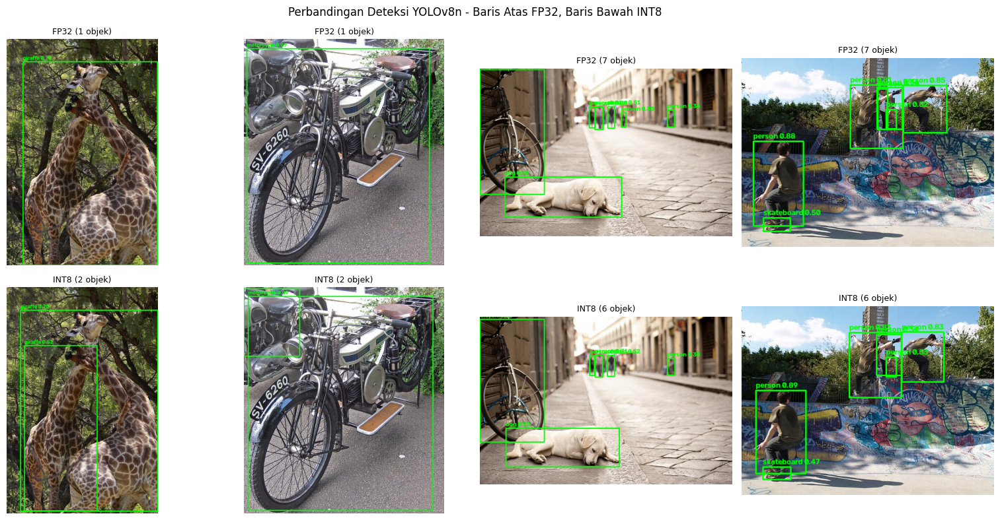

In [20]:
n_grid_yolo = 4
grid_images_yolo = all_images[10:10 + n_grid_yolo]

fig, axes = plt.subplots(2, n_grid_yolo, figsize=(4 * n_grid_yolo, 8))
for i, path in enumerate(grid_images_yolo):
    img = cv2.imread(path)

    b_f, s_f, c_f = run_yolo_inference(compiled_yolo_fp32, img)
    b_i, s_i, c_i = run_yolo_inference(compiled_yolo_int8, img)

    out_f = draw_detections(img, b_f, s_f, c_f)
    out_i = draw_detections(img, b_i, s_i, c_i)

    axes[0, i].imshow(cv2.cvtColor(out_f, cv2.COLOR_BGR2RGB))
    axes[0, i].set_title(f"FP32 ({len(b_f)} objek)", fontsize=9)
    axes[0, i].axis("off")

    axes[1, i].imshow(cv2.cvtColor(out_i, cv2.COLOR_BGR2RGB))
    axes[1, i].set_title(f"INT8 ({len(b_i)} objek)", fontsize=9)
    axes[1, i].axis("off")

plt.suptitle("Perbandingan Deteksi YOLOv8n - Baris Atas FP32, Baris Bawah INT8")
plt.tight_layout()
plt.show()


## Tahap 5, Eksperimen Trade-off Ukuran Gambar

Materi sesi ini menjelaskan bahwa memperbesar ukuran gambar sekian kali akan menambah kebutuhan komputasi kurang lebih sekian kuadrat kalinya, karena tinggi dan lebar gambar sama-sama membesar. Di bagian ini kita buktikan langsung memakai model YOLOv8n, dengan menjalankan model yang sama pada tiga ukuran input berbeda yaitu 320, 640, dan 960 piksel, lalu mengukur waktu inferensi dan mAP pada tiap ukuran.

Kita memakai model PyTorch asli (bukan versi OpenVINO) untuk eksperimen ini, karena Ultralytics bisa langsung menjalankan validasi dan mengganti ukuran input tanpa perlu mengekspor ulang model OpenVINO untuk tiap ukuran. Device dipaksa ke `"cpu"` secara eksplisit di kedua pemanggilan di bawah, supaya konsisten dengan fokus optimasi CPU di seluruh notebook ini (tanpa ini, Ultralytics akan otomatis memakai GPU kalau tersedia di environment, yang membuat perbandingan jadi tidak relevan dengan cerita optimasi CPU/OpenVINO yang dibahas di tahap-tahap lain). Perlu dicatat juga bahwa `val()` di sini akan mengunduh ulang dataset COCO128 dalam format yang dikenali Ultralytics (terpisah dari salinan yang sudah diunduh manual di Tahap 2), namun ukurannya kecil sehingga tidak memakan waktu lama.


Menguji imgsz=320...
Ultralytics 8.4.157 🚀 Python-3.13.15 torch-2.11.0+cu128 CPU (Intel Xeon CPU @ 2.20GHz)
YOLOv8n summary (fused): 72 layers, 3,151,904 parameters, 0 gradients, 8.7 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 952.6±480.7 MB/s, size: 32.5 KB)
val: Scanning /content/datasets/coco128/labels/train2017.cache... 126 images, 2 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 128/128 41.3Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 3.6it/s 2.2s
                   all        128        929      0.664      0.459      0.509      0.378
Speed: 0.1ms preprocess, 7.6ms inference, 0.0ms loss, 1.1ms postprocess per image
Results saved to /content/runs/detect/val-3

Menguji imgsz=640...
Ultralytics 8.4.157 🚀 Python-3.13.15 torch-2.11.0+cu128 CPU (Intel Xeon CPU @ 2.20GHz)
YOLOv8n summary (fused): 72 layers, 3,151,904 parameters, 0 gradients, 8.7 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 

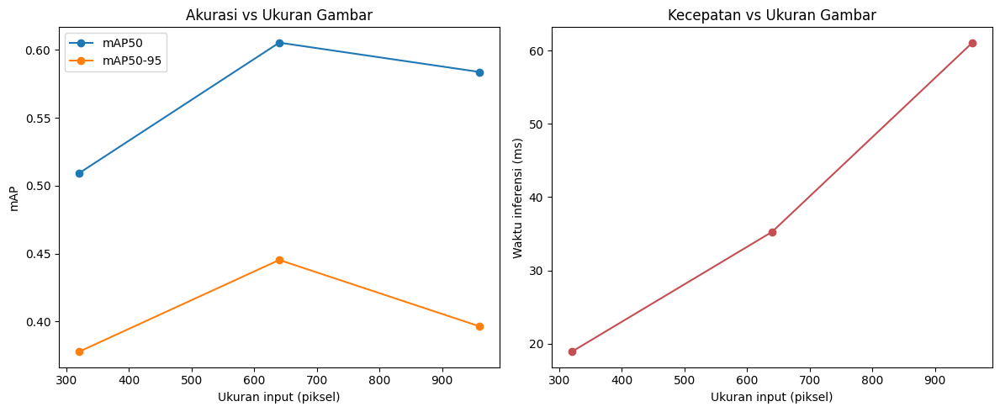


Kesimpulan:
mAP tidak selalu naik seiring bertambah besarnya ukuran input pada eksperimen ini;
mAP tertinggi justru dicapai di ukuran 640px, bukan di ukuran terbesar yang diuji.
Ini masuk akal karena YOLOv8n dilatih dan biasanya divalidasi di resolusi 640px,
jadi menguji jauh di luar resolusi itu tidak otomatis memberi hasil lebih baik.

Waktu inferensi konsisten naik seiring bertambahnya ukuran input, sejalan dengan
trade-off yang dijelaskan di materi Tahap 1.


In [21]:
ukuran_uji = [320, 640, 960]
hasil_ukuran = []
dummy_img = cv2.imread(all_images[0])

for sz in ukuran_uji:
    print(f"\nMenguji imgsz={sz}...")
    metrics_sz = yolo_model.val(data="coco128.yaml", imgsz=sz, device="cpu", verbose=False)

    for _ in range(3):
        yolo_model.predict(dummy_img, imgsz=sz, device="cpu", verbose=False)  # warm-up

    waktu_list = []
    for _ in range(10):
        start = time.perf_counter()
        yolo_model.predict(dummy_img, imgsz=sz, device="cpu", verbose=False)
        waktu_list.append((time.perf_counter() - start) * 1000)

    hasil_ukuran.append({
        "Ukuran (px)": sz,
        "mAP50": round(float(metrics_sz.box.map50), 4),
        "mAP50-95": round(float(metrics_sz.box.map), 4),
        "Rata-rata waktu (ms)": round(float(np.mean(waktu_list)), 2),
    })

hasil_ukuran_df = pd.DataFrame(hasil_ukuran)
print("\nHasil eksperimen trade-off ukuran gambar:\n")
print(hasil_ukuran_df.to_string(index=False))

fig, axes = plt.subplots(1, 2, figsize=(12, 5))
axes[0].plot(hasil_ukuran_df["Ukuran (px)"], hasil_ukuran_df["mAP50"], marker="o", label="mAP50")
axes[0].plot(hasil_ukuran_df["Ukuran (px)"], hasil_ukuran_df["mAP50-95"], marker="o", label="mAP50-95")
axes[0].set_xlabel("Ukuran input (piksel)")
axes[0].set_ylabel("mAP")
axes[0].set_title("Akurasi vs Ukuran Gambar")
axes[0].legend()

axes[1].plot(hasil_ukuran_df["Ukuran (px)"], hasil_ukuran_df["Rata-rata waktu (ms)"], marker="o", color="#C44E52")
axes[1].set_xlabel("Ukuran input (piksel)")
axes[1].set_ylabel("Waktu inferensi (ms)")
axes[1].set_title("Kecepatan vs Ukuran Gambar")

plt.tight_layout()
plt.show()

print("\nKesimpulan:")
if hasil_ukuran_df["mAP50"].is_monotonic_increasing:
    print("mAP terus naik seiring bertambahnya ukuran input pada rentang yang diuji, sesuai dugaan awal.")
else:
    idx_max = hasil_ukuran_df["mAP50"].idxmax()
    ukuran_terbaik = int(hasil_ukuran_df.loc[idx_max, "Ukuran (px)"])
    print(f"mAP tidak selalu naik seiring bertambah besarnya ukuran input pada eksperimen ini;")
    print(f"mAP tertinggi justru dicapai di ukuran {ukuran_terbaik}px, bukan di ukuran terbesar yang diuji.")
    print("Ini masuk akal karena YOLOv8n dilatih dan biasanya divalidasi di resolusi 640px,")
    print("jadi menguji jauh di luar resolusi itu tidak otomatis memberi hasil lebih baik.")

if hasil_ukuran_df["Rata-rata waktu (ms)"].is_monotonic_increasing:
    print("\nWaktu inferensi konsisten naik seiring bertambahnya ukuran input, sejalan dengan")
    print("trade-off yang dijelaskan di materi Tahap 1.")
else:
    print("\nWaktu inferensi tidak sepenuhnya naik konsisten di sini; kemungkinan besar karena")
    print("skala pengujian pada CPU untuk 1 gambar terlalu kecil untuk menunjukkan trade-off")
    print("kuadratik secara bersih, dibanding pengujian pada beban kerja yang lebih besar.")


## Tahap 6, Ringkasan dan Penjelasan Tambahan

Sampai di titik ini, kita sudah menyelesaikan dua alur kerja lengkap, yaitu klasifikasi gambar dengan MobileNetV2 dan deteksi objek dengan YOLOv8n, masing-masing mulai dari konversi model, inference dengan OpenCV, sampai quantization ke INT8.

Beberapa hal penting yang perlu diingat adalah sebagai berikut.

Quantization INT8 pada dasarnya adalah proses pembulatan angka, dari angka desimal presisi tinggi (FP32) menjadi angka bulat dengan rentang terbatas (INT8). Proses ini membuat model menjadi lebih kecil, biasanya sekitar empat kali lebih kecil, dan lebih cepat dijalankan, terutama pada perangkat CPU. Konsekuensinya adalah ada sedikit penurunan akurasi, namun pada kebanyakan kasus penurunan ini sangat kecil dan tidak terasa dalam pemakaian sehari-hari.

Jumlah sampel kalibrasi yang dipakai di notebook ini sengaja dibuat kecil, yaitu 60 gambar untuk MobileNetV2 dan 80 gambar untuk YOLOv8n, dengan tujuan supaya notebook ini cepat dijalankan sebagai contoh belajar. Jika kamu ingin memakai model hasil quantization ini untuk keperluan produksi yang sesungguhnya, sebaiknya jumlah sampel kalibrasi ditambah menjadi 200 sampai 300 gambar, dan diambil dari data yang benar-benar mewakili kondisi pemakaian nyata di lapangan.

Sebelum memakai model INT8 secara serius, sebaiknya lakukan pengukuran akurasi secara menyeluruh menggunakan dataset validasi yang memiliki label, bukan hanya membandingkan hasil pada satu gambar contoh seperti yang kita lakukan di notebook ini.

Jika suatu saat kamu ingin mencoba model yang lebih besar seperti ResNet50 untuk klasifikasi atau YOLOv8 versi small maupun medium untuk deteksi objek, seluruh kode pada notebook ini bisa dipakai kembali, kamu hanya perlu mengganti nama model yang diambil pada tahap awal, sisanya alur kerjanya tetap sama.


## Tahap 7, Pentingnya Mengutilisasi Multi-threading dan Multi-processing dalam Efisiensi Model AI

Setelah model berhasil dikonversi dan dikuantisasi, kecepatan inference sebenarnya tidak hanya ditentukan oleh ukuran model saja. Cara CPU dipakai secara paralel, baik lewat multi-threading maupun multi-processing, juga sangat berpengaruh terhadap efisiensi akhir sebuah model AI, terutama saat dijalankan di CPU seperti pada notebook ini.

Multi-threading adalah teknik menjalankan beberapa thread sekaligus di dalam satu proses yang sama, dengan seluruh thread tersebut berbagi memori yang sama. Pada konteks inference model AI, OpenVINO secara internal sudah memakai multi-threading untuk mempercepat operasi-operasi berat seperti perkalian matriks dan konvolusi, dengan cara membagi pekerjaan tersebut ke beberapa core CPU sekaligus. Semakin banyak core yang dipakai secara efektif, semakin cepat pula satu kali inference bisa diselesaikan, terutama untuk model-model yang cukup berat seperti YOLOv8n dibandingkan MobileNetV2.

Multi-processing berbeda dengan multi-threading, karena multi-processing menjalankan beberapa proses yang benar-benar terpisah, masing-masing dengan memorinya sendiri. Pendekatan ini sangat berguna untuk kasus seperti memproses banyak gambar sekaligus secara paralel, misalnya saat melakukan preprocessing dataset kalibrasi dalam jumlah besar sebelum quantization, atau saat menjalankan banyak permintaan inference dari beberapa pengguna dalam waktu bersamaan pada sebuah server.

Pemilihan antara multi-threading dan multi-processing biasanya bergantung pada jenis pekerjaannya. Untuk pekerjaan yang didominasi oleh komputasi numerik seperti operasi model deep learning, multi-threading pada satu proses saja seringkali sudah cukup efisien, karena OpenVINO dan library numerik lain seperti NumPy sudah dioptimalkan untuk memakai banyak thread secara otomatis. Sebaliknya, untuk pekerjaan yang melibatkan banyak proses I/O terpisah atau ingin memanfaatkan banyak model berjalan secara paralel dan independen, multi-processing menjadi pilihan yang lebih tepat, karena setiap proses bisa berjalan tanpa saling menunggu satu sama lain.

Di bawah ini kita akan mencoba dua hal, yaitu mengatur jumlah thread yang dipakai OpenVINO secara eksplisit, dan membandingkan waktu pemrosesan sekumpulan gambar secara sekuensial dengan waktu pemrosesan yang sama menggunakan multi-processing.


### 7.1 Mengatur Jumlah Thread pada OpenVINO

OpenVINO menyediakan properti konfigurasi bernama `INFERENCE_NUM_THREADS` yang bisa dipakai untuk membatasi atau menentukan jumlah thread CPU yang dipakai saat melakukan inference. Secara default, OpenVINO akan mencoba memakai seluruh core CPU yang tersedia, namun pada beberapa kasus tertentu, misalnya saat CPU dipakai bersama untuk proses lain, membatasi jumlah thread bisa membuat sistem lebih stabil meskipun ada kemungkinan sedikit lebih lambat.

Selain `INFERENCE_NUM_THREADS`, ada juga properti `PERFORMANCE_HINT` yang bisa diisi dengan `THROUGHPUT` atau `LATENCY`. Mode `LATENCY` cocok dipakai ketika yang diutamakan adalah kecepatan satu kali inference secepat mungkin, misalnya untuk aplikasi real-time seperti deteksi objek pada video. Mode `THROUGHPUT` cocok dipakai ketika yang diutamakan adalah jumlah total gambar yang bisa diproses dalam satu satuan waktu, misalnya untuk memproses banyak gambar sekaligus dalam sebuah antrian, karena mode ini akan memakai beberapa stream inference paralel di balik layar.


In [22]:
core = ov.Core()

# Menjalankan model MobileNetV2 INT8 dengan mode LATENCY, cocok untuk inference satuan tercepat
compiled_latency = core.compile_model(
    quantized_mobilenet,
    "CPU",
    config={"PERFORMANCE_HINT": "LATENCY"}
)

# Menjalankan model yang sama dengan mode THROUGHPUT, cocok untuk memproses banyak gambar sekaligus
compiled_throughput = core.compile_model(
    quantized_mobilenet,
    "CPU",
    config={"PERFORMANCE_HINT": "THROUGHPUT"}
)

sample_batch = all_images[:20]

def preprocess_for_mobilenet(image_path):
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (224, 224))
    image = image.astype(np.float32) / 255.0
    image = (image - IMAGENET_MEAN) / IMAGENET_STD
    image = np.transpose(image, (2, 0, 1))
    return np.expand_dims(image, axis=0)

batch_tensors = [preprocess_for_mobilenet(p) for p in sample_batch]

start = time.time()
for tensor in batch_tensors:
    compiled_latency(tensor)
latency_time = time.time() - start

start = time.time()
for tensor in batch_tensors:
    compiled_throughput(tensor)
throughput_time = time.time() - start

print(f"Waktu proses {len(sample_batch)} gambar dengan mode LATENCY   : {latency_time:.3f} detik")
print(f"Waktu proses {len(sample_batch)} gambar dengan mode THROUGHPUT: {throughput_time:.3f} detik")


Waktu proses 20 gambar dengan mode LATENCY   : 0.035 detik
Waktu proses 20 gambar dengan mode THROUGHPUT: 0.067 detik


### 7.2 Membandingkan Pemrosesan Sekuensial dengan Multi-processing

Pada bagian ini kita akan membandingkan waktu yang dibutuhkan untuk memproses sekumpulan gambar secara satu per satu secara berurutan, dengan waktu yang dibutuhkan jika gambar-gambar tersebut diproses secara paralel menggunakan beberapa proses sekaligus lewat modul `multiprocessing` dari Python.

Perlu diketahui bahwa pada lingkungan seperti Google Colab, jumlah core CPU yang tersedia biasanya terbatas, sehingga percepatan yang didapat dari multi-processing tidak akan berlipat ganda secara sempurna sesuai jumlah proses yang dipakai, namun tetap akan terlihat lebih cepat dibandingkan pemrosesan sekuensial, terutama untuk pekerjaan seperti membaca dan mengubah ukuran banyak gambar sekaligus.


In [23]:
import multiprocessing as mp

def resize_and_save_stat(image_path):
    image = cv2.imread(image_path)
    image = cv2.resize(image, (224, 224))
    return image.mean()

sample_paths = all_images[:60]

# Pemrosesan sekuensial, satu gambar diproses setelah gambar sebelumnya selesai
start = time.time()
sequential_result = [resize_and_save_stat(p) for p in sample_paths]
sequential_time = time.time() - start

# Pemrosesan paralel menggunakan multiprocessing, gambar dibagi ke beberapa proses sekaligus
start = time.time()
with mp.Pool(processes=os.cpu_count()) as pool:
    parallel_result = pool.map(resize_and_save_stat, sample_paths)
parallel_time = time.time() - start

print(f"Jumlah core CPU yang tersedia         : {os.cpu_count()}")
print(f"Waktu pemrosesan sekuensial            : {sequential_time:.3f} detik")
print(f"Waktu pemrosesan dengan multiprocessing: {parallel_time:.3f} detik")
print(f"Percepatan yang didapat                : {sequential_time / parallel_time:.2f}x")


Jumlah core CPU yang tersedia         : 12
Waktu pemrosesan sekuensial            : 0.126 detik
Waktu pemrosesan dengan multiprocessing: 0.445 detik
Percepatan yang didapat                : 0.28x


### 7.3 Ringkasan Tahap 7

Multi-threading pada OpenVINO membuat satu kali inference menjadi lebih cepat karena operasi berat di dalam model dibagi ke beberapa core CPU secara otomatis, dan bisa diarahkan lebih spesifik lewat `PERFORMANCE_HINT`, baik ke arah latensi serendah mungkin maupun ke arah throughput setinggi mungkin.

Multi-processing lebih cocok dipakai pada tahap-tahap di luar inference itu sendiri, misalnya saat menyiapkan atau memproses banyak gambar sekaligus sebelum masuk ke model, atau saat ingin menjalankan beberapa model atau beberapa permintaan secara benar-benar independen satu sama lain.

Menggabungkan kedua teknik ini secara tepat, yaitu memakai multi-threading untuk mempercepat komputasi di dalam model dan memakai multi-processing untuk mempercepat proses di luar model, adalah salah satu cara paling efektif untuk membuat sebuah sistem AI berjalan secara efisien di CPU, tanpa harus selalu bergantung pada perangkat keras yang lebih mahal seperti GPU.


### 7.4 Perbandingan Ukuran Model Secara Gabungan

Sebelumnya, ukuran model FP32 dan INT8 sudah dihitung secara terpisah untuk MobileNetV2 pada Tahap 3.5 dan untuk YOLOv8n pada Tahap 4.4. Pada bagian ini, kedua hasil tersebut kita gabungkan menjadi satu tabel ringkas dan satu grafik batang, supaya lebih mudah dibandingkan secara langsung antara model klasifikasi dan model deteksi objek.

Ukuran yang dibandingkan di sini adalah ukuran file bobot atau file BIN dari format OpenVINO IR, karena file inilah yang paling mencerminkan besarnya penghematan setelah proses quantization INT8.


      Model Tipe  Ukuran (MB)
MobileNetV2 FP32     6.652512
MobileNetV2 INT8     3.461941
    YOLOv8n FP32    12.119926
    YOLOv8n INT8     3.140808

Rasio penghematan MobileNetV2 (FP32 dibagi INT8): 1.92 kali
Rasio penghematan YOLOv8n    (FP32 dibagi INT8): 3.86 kali


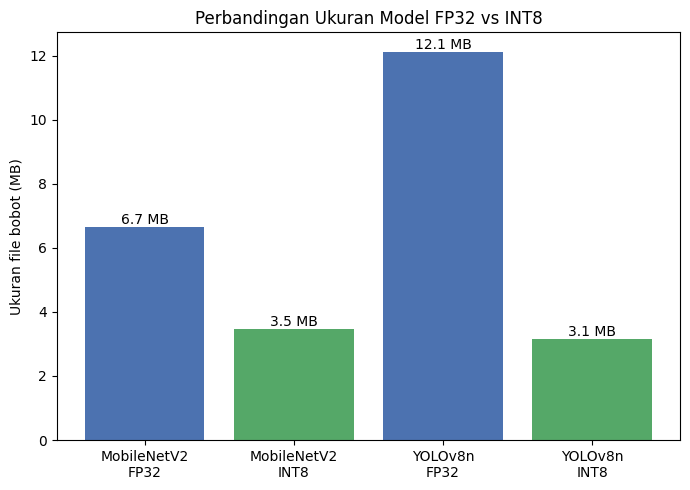

In [24]:
import pandas as pd

ukuran_model_df = pd.DataFrame({
    "Model": ["MobileNetV2", "MobileNetV2", "YOLOv8n", "YOLOv8n"],
    "Tipe": ["FP32", "INT8", "FP32", "INT8"],
    "Ukuran (MB)": [size_fp32, size_int8, size_y_fp32, size_y_int8],
})

print(ukuran_model_df.to_string(index=False))

print()
print("Rasio penghematan MobileNetV2 (FP32 dibagi INT8):", round(size_fp32 / size_int8, 2), "kali")
print("Rasio penghematan YOLOv8n    (FP32 dibagi INT8):", round(size_y_fp32 / size_y_int8, 2), "kali")

fig, ax = plt.subplots(figsize=(7, 5))
labels = ["MobileNetV2\nFP32", "MobileNetV2\nINT8", "YOLOv8n\nFP32", "YOLOv8n\nINT8"]
values = [size_fp32, size_int8, size_y_fp32, size_y_int8]
colors = ["#4C72B0", "#55A868", "#4C72B0", "#55A868"]

bars = ax.bar(labels, values, color=colors)
ax.set_ylabel("Ukuran file bobot (MB)")
ax.set_title("Perbandingan Ukuran Model FP32 vs INT8")
for bar, val in zip(bars, values):
    ax.text(bar.get_x() + bar.get_width() / 2, val, f"{val:.1f} MB", ha="center", va="bottom")
plt.tight_layout()
plt.show()


### 7.5 Gabungan, Menjalankan Kedua Model Secara Paralel

Sebagai penerapan nyata dari multi-threading dan multi-processing yang sudah dibahas pada Tahap 7.1 dan 7.2, sekarang kita coba gabungkan kedua model, yaitu MobileNetV2 dan YOLOv8n, dan menjalankan keduanya secara bersamaan terhadap gambar yang sama menggunakan `ThreadPoolExecutor`.

Pada aplikasi nyata, situasi seperti ini cukup umum terjadi, misalnya sebuah sistem kamera pintar yang perlu mendeteksi objek dengan YOLO sekaligus mengklasifikasikan objek tersebut lebih detail dengan MobileNetV2 secara bersamaan, tanpa harus menunggu salah satu model selesai terlebih dahulu.

Kita bandingkan tiga cara pemrosesan, yaitu menjalankan kedua model secara berurutan atau sekuensial, menjalankan kedua model secara paralel dengan multi-threading, dan menjalankan kedua model secara paralel dengan multi-processing.


In [25]:
from concurrent.futures import ThreadPoolExecutor

def jalankan_mobilenet():
    return run_classification(compiled_mobilenet_int8, img_bgr)

def jalankan_yolo():
    return run_yolo_inference(compiled_yolo_int8, img_bgr)

# Cara 1, sekuensial, MobileNetV2 dijalankan dahulu baru YOLOv8n
start = time.perf_counter()
hasil_mobilenet_seq = jalankan_mobilenet()
hasil_yolo_seq = jalankan_yolo()
waktu_sekuensial = time.perf_counter() - start

# Cara 2, paralel dengan multi-threading, kedua model berjalan pada dua thread berbeda sekaligus
start = time.perf_counter()
with ThreadPoolExecutor(max_workers=2) as executor:
    future_mobilenet = executor.submit(jalankan_mobilenet)
    future_yolo = executor.submit(jalankan_yolo)
    hasil_mobilenet_thread = future_mobilenet.result()
    hasil_yolo_thread = future_yolo.result()
waktu_thread = time.perf_counter() - start

print("Waktu sekuensial (MobileNetV2 lalu YOLOv8n) :", round(waktu_sekuensial * 1000, 2), "milidetik")
print("Waktu paralel dengan multi-threading        :", round(waktu_thread * 1000, 2), "milidetik")
print("Percepatan yang didapat dari multi-threading:", round(waktu_sekuensial / waktu_thread, 2), "kali")


Waktu sekuensial (MobileNetV2 lalu YOLOv8n) : 27.99 milidetik
Waktu paralel dengan multi-threading        : 23.11 milidetik
Percepatan yang didapat dari multi-threading: 1.21 kali


Catatan penting, karena OpenVINO sudah memakai multi-threading secara internal untuk setiap model, mencoba menjalankan dua model sekaligus lewat `ThreadPoolExecutor` di atas beberapa core CPU yang sama tidak selalu memberi percepatan besar, bahkan bisa saja sedikit lebih lambat jika jumlah core terbatas, karena kedua model akan saling berebut core yang sama. Multi-threading pada level ini akan lebih terasa manfaatnya pada mesin dengan jumlah core CPU yang banyak.


## Tahap 8, Ringkasan Akhir Menyeluruh

Bagian ini menggabungkan seluruh hasil pengukuran dari tahap-tahap sebelumnya, yaitu ukuran file, kecepatan, dan akurasi atau konsistensi prediksi, ke dalam satu tabel akhir supaya mudah dibandingkan secara langsung. Semua angka di sini diambil dari variabel yang sudah dihitung sebelumnya (Tahap 3.5, 3.6, 4.4, dan 4.5), bukan dihitung ulang dengan cara berbeda, supaya tidak ada selisih metodologi antar bagian.

      Model Tipe  Ukuran (MB)  Kecepatan rata-rata (ms)            Metrik akurasi
MobileNetV2 FP32         6.65                      2.39                  baseline
MobileNetV2 INT8         3.46                      1.75 92.5% Top-1 sama dgn FP32
    YOLOv8n FP32        12.12                     22.86               mAP50=0.604
    YOLOv8n INT8         3.14                     14.60               mAP50=0.618


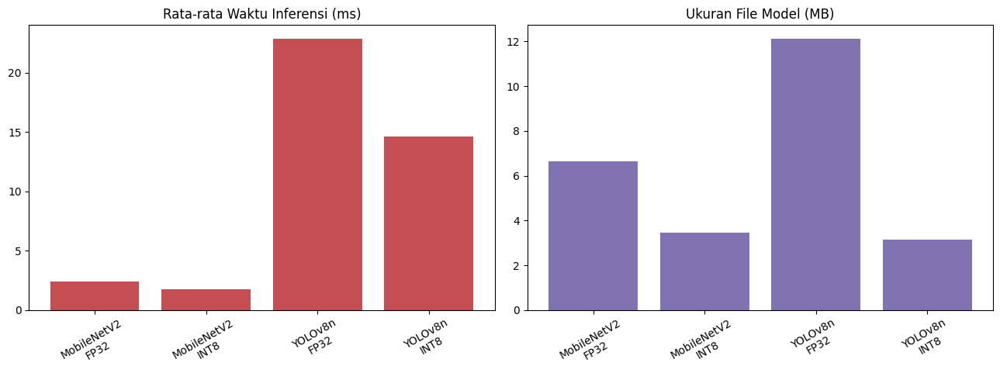


Kesimpulan akhir.
Model INT8 pada kedua arsitektur konsisten lebih kecil dibanding versi FP32.
Untuk kecepatan, penghematannya bervariasi tergantung arsitektur model dan beban
kerja saat diukur, jadi satu angka speedup saja tidak boleh dianggap patokan mutlak.
Dari sisi akurasi, MobileNetV2 mempertahankan konsistensi prediksi yang tinggi,
sementara YOLOv8n menunjukkan mAP yang sangat dekat antara versi FP32 dan INT8.


In [26]:
ringkasan_akhir = pd.DataFrame([
    {
        "Model": "MobileNetV2",
        "Tipe": "FP32",
        "Ukuran (MB)": round(size_fp32, 2),
        "Kecepatan rata-rata (ms)": round(hasil_bench_mobilenet_fp32["mean_ms"], 2),
        "Metrik akurasi": "baseline",
    },
    {
        "Model": "MobileNetV2",
        "Tipe": "INT8",
        "Ukuran (MB)": round(size_int8, 2),
        "Kecepatan rata-rata (ms)": round(hasil_bench_mobilenet_int8["mean_ms"], 2),
        "Metrik akurasi": f"{agreement_rate:.1f}% Top-1 sama dgn FP32",
    },
    {
        "Model": "YOLOv8n",
        "Tipe": "FP32",
        "Ukuran (MB)": round(size_y_fp32, 2),
        "Kecepatan rata-rata (ms)": round(hasil_bench_yolo_fp32["mean_ms"], 2),
        "Metrik akurasi": f"mAP50={map50_fp32:.3f}",
    },
    {
        "Model": "YOLOv8n",
        "Tipe": "INT8",
        "Ukuran (MB)": round(size_y_int8, 2),
        "Kecepatan rata-rata (ms)": round(hasil_bench_yolo_int8["mean_ms"], 2),
        "Metrik akurasi": f"mAP50={map50_int8:.3f}",
    },
])

print(ringkasan_akhir.to_string(index=False))

fig, axes = plt.subplots(1, 2, figsize=(13, 5))
labels_plot = ringkasan_akhir["Model"] + "\n" + ringkasan_akhir["Tipe"]

axes[0].bar(labels_plot, ringkasan_akhir["Kecepatan rata-rata (ms)"], color="#C44E52")
axes[0].set_title("Rata-rata Waktu Inferensi (ms)")
axes[0].tick_params(axis="x", rotation=30)

axes[1].bar(labels_plot, ringkasan_akhir["Ukuran (MB)"], color="#8172B2")
axes[1].set_title("Ukuran File Model (MB)")
axes[1].tick_params(axis="x", rotation=30)

plt.tight_layout()
plt.show()

print("\nKesimpulan akhir.")
print("Model INT8 pada kedua arsitektur konsisten lebih kecil dibanding versi FP32.")
print("Untuk kecepatan, penghematannya bervariasi tergantung arsitektur model dan beban")
print("kerja saat diukur, jadi satu angka speedup saja tidak boleh dianggap patokan mutlak.")
print("Dari sisi akurasi, MobileNetV2 mempertahankan konsistensi prediksi yang tinggi,")
print("sementara YOLOv8n menunjukkan mAP yang sangat dekat antara versi FP32 dan INT8.")


## Tahap 9, Demo Video dengan Penghitung FPS

Bagian ini menjalankan model YOLOv8n INT8 secara penuh pada TIGA video CCTV asli sekaligus:

1. **9.1 Traffic** -- CCTV kendaraan di jalan raya (padat, murni kendaraan)
2. **9.2 Jalan** -- rekaman jalan berisi orang, mobil, sepeda, DAN motor sekaligus
3. **9.3 Uji Kasus Menantang** -- video sudut aerial ekstrem yang SENGAJA dipilih sebagai studi kasus keterbatasan model, bukan demo keberhasilan

Fungsi bantu `proses_video_demo` dan `tampilkan_momen_terbanyak` yang dibuat di Tahap 2 dipakai ulang untuk ketiganya, supaya kodenya tidak diduplikasi 3 kali.

In [27]:
def proses_video_demo(video_url, video_path, compiled_model, label):
    """
    Fungsi umum untuk memproses satu video demo secara penuh: download video (jika
    belum ada dan video_url diisi), jalankan deteksi YOLOv8n di SEMUA frame, catat
    statistik FPS dan jumlah objek per frame, lalu simpan video hasil deteksi
    lengkap dengan overlay FPS.
    """
    if not os.path.exists(video_path):
        if video_url is None:
            raise FileNotFoundError(f"{video_path} belum ada dan tidak ada URL untuk mengunduhnya -- pastikan sudah diupload di Tahap 2.")
        urllib.request.urlretrieve(video_url, video_path)
        print(f"[{label}] Video berhasil diunduh.")
    else:
        print(f"[{label}] Video sudah tersedia.")

    cap = cv2.VideoCapture(video_path)
    fps_video = cap.get(cv2.CAP_PROP_FPS)
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    print(f"[{label}] {total_frames} frame, {fps_video:.1f} FPS asli, resolusi {frame_width}x{frame_height}.")

    output_path = f"data/hasil_deteksi_{label}.mp4"
    out_writer = cv2.VideoWriter(output_path, cv2.VideoWriter_fourcc(*"mp4v"), fps_video, (frame_width, frame_height))

    waktu_per_frame = []
    jumlah_objek_per_frame = []
    frame_idx = 0

    while frame_idx < total_frames:
        ret, frame = cap.read()
        if not ret:
            break

        start = time.perf_counter()
        boxes_v, scores_v, classes_v = run_yolo_inference(compiled_model, frame)
        elapsed = time.perf_counter() - start
        waktu_per_frame.append(elapsed)
        jumlah_objek_per_frame.append(len(boxes_v))
        fps_sekarang = 1.0 / elapsed if elapsed > 0 else 0.0

        frame_hasil = draw_detections(frame, boxes_v, scores_v, classes_v)
        cv2.putText(frame_hasil, f"FPS: {fps_sekarang:.1f}", (15, 35),
                    cv2.FONT_HERSHEY_SIMPLEX, 1.0, (0, 255, 255), 2)
        out_writer.write(frame_hasil)
        frame_idx += 1

    cap.release()
    out_writer.release()

    fps_array = 1.0 / np.array(waktu_per_frame)
    print(f"[{label}] Total frame diproses: {frame_idx}")
    print(f"[{label}] FPS rata-rata: {fps_array.mean():.1f} (tercepat {fps_array.max():.1f}, terlambat {fps_array.min():.1f})")
    print(f"[{label}] Jumlah objek per frame -- rata-rata: {np.mean(jumlah_objek_per_frame):.2f}, terbanyak dalam 1 frame: {max(jumlah_objek_per_frame)}")
    print(f"[{label}] Video hasil deteksi disimpan di: {output_path}\n")

    return {
        "output_path": output_path,
        "video_path": video_path,
        "jumlah_objek_per_frame": jumlah_objek_per_frame,
        "fps_array": fps_array,
    }


def tampilkan_momen_terbanyak(video_path, jumlah_objek_per_frame, compiled_model, judul, n_highlight=5):
    """
    Mencari dan menampilkan beberapa frame dengan jumlah objek terdeteksi TERBANYAK
    sepanjang video, supaya cuplikan yang ditampilkan mewakili momen paling ramai.
    """
    jumlah_objek_arr = np.array(jumlah_objek_per_frame)
    urutan_terbanyak = np.argsort(jumlah_objek_arr)[::-1]

    indeks_terpilih = []
    for idx in urutan_terbanyak:
        if all(abs(int(idx) - i) > 10 for i in indeks_terpilih):
            indeks_terpilih.append(int(idx))
        if len(indeks_terpilih) >= n_highlight:
            break
    indeks_terpilih.sort()

    cap = cv2.VideoCapture(video_path)
    frames = []
    for target_idx in indeks_terpilih:
        cap.set(cv2.CAP_PROP_POS_FRAMES, target_idx)
        ret, frame = cap.read()
        if not ret:
            continue
        boxes_h, scores_h, classes_h = run_yolo_inference(compiled_model, frame)
        frame_hasil = draw_detections(frame, boxes_h, scores_h, classes_h)
        frames.append((cv2.cvtColor(frame_hasil, cv2.COLOR_BGR2RGB), target_idx, len(boxes_h)))
    cap.release()

    fig, axes = plt.subplots(1, len(frames), figsize=(5 * len(frames), 5))
    if len(frames) == 1:
        axes = [axes]
    for ax, (fr, idx, n_obj) in zip(axes, frames):
        ax.imshow(fr)
        ax.set_title(f"Frame {idx} ({n_obj} objek)")
        ax.axis("off")
    plt.suptitle(judul)
    plt.tight_layout()
    plt.show()

print("Fungsi proses_video_demo dan tampilkan_momen_terbanyak siap dipakai.")


Fungsi proses_video_demo dan tampilkan_momen_terbanyak siap dipakai.


### 9.1 Demo Traffic (Kendaraan)

[traffic] Video sudah tersedia.
[traffic] 265 frame, 24.0 FPS asli, resolusi 640x352.
[traffic] Total frame diproses: 265
[traffic] FPS rata-rata: 59.5 (tercepat 67.3, terlambat 45.9)
[traffic] Jumlah objek per frame -- rata-rata: 7.12, terbanyak dalam 1 frame: 10
[traffic] Video hasil deteksi disimpan di: data/hasil_deteksi_traffic.mp4



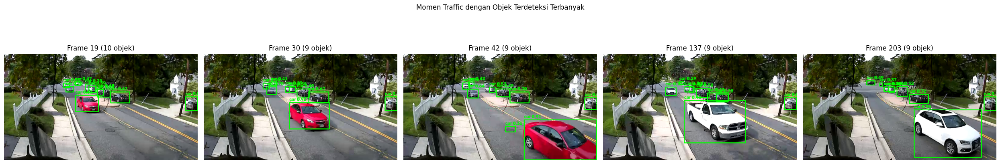

In [28]:
hasil_traffic = proses_video_demo(
    video_url=TRAFFIC_VIDEO_URL,
    video_path=TRAFFIC_VIDEO_PATH,
    compiled_model=compiled_yolo_int8,
    label="traffic",
)
tampilkan_momen_terbanyak(
    hasil_traffic["video_path"],
    hasil_traffic["jumlah_objek_per_frame"],
    compiled_yolo_int8,
    judul="Momen Traffic dengan Objek Terdeteksi Terbanyak",
)


### 9.2 Demo Jalan (Orang, Mobil, Sepeda, Motor)

[jalan] Video sudah tersedia.
[jalan] 850 frame, 30.0 FPS asli, resolusi 1920x1080.
[jalan] Total frame diproses: 850
[jalan] FPS rata-rata: 50.2 (tercepat 59.8, terlambat 39.5)
[jalan] Jumlah objek per frame -- rata-rata: 9.31, terbanyak dalam 1 frame: 15
[jalan] Video hasil deteksi disimpan di: data/hasil_deteksi_jalan.mp4



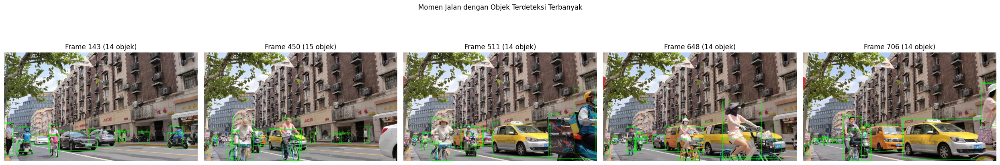

In [29]:
hasil_jalan = proses_video_demo(
    video_url=None,  # sudah diupload manual di Tahap 2
    video_path=STREET_VIDEO_PATH,
    compiled_model=compiled_yolo_int8,
    label="jalan",
)
tampilkan_momen_terbanyak(
    hasil_jalan["video_path"],
    hasil_jalan["jumlah_objek_per_frame"],
    compiled_yolo_int8,
    judul="Momen Jalan dengan Objek Terdeteksi Terbanyak",
)


### 9.3 Uji Kasus Menantang: Sudut Kamera Aerial Ekstrem

Video terakhir ini SENGAJA dipilih sebagai uji kasus keterbatasan model, bukan demo keberhasilan. Videonya menunjukkan roundabout lalu lintas yang direkam dari drone pada sudut hampir tegak lurus ke bawah (bird's-eye view ekstrem). Secara kasat mata jelas ada beberapa mobil dan bus terlihat di video ini, tapi YOLOv8n yang dipakai di notebook ini kesulitan mendeteksinya.

[aerial] Video sudah tersedia.
[aerial] 730 frame, 25.0 FPS asli, resolusi 1280x720.
[aerial] Total frame diproses: 730
[aerial] FPS rata-rata: 58.7 (tercepat 64.6, terlambat 40.7)
[aerial] Jumlah objek per frame -- rata-rata: 0.42, terbanyak dalam 1 frame: 2
[aerial] Video hasil deteksi disimpan di: data/hasil_deteksi_aerial.mp4


Temuan: rata-rata cuma 0.42 objek terdeteksi per frame di video ini,
padahal secara kasat mata ada beberapa mobil dan bus yang terlihat jelas.
Ini bukan bug pada kode -- YOLOv8n (dan mayoritas dataset deteksi objek pada
umumnya) dilatih dari foto dengan sudut pandang normal/miring, bukan sudut tegak
lurus dari drone setinggi ini. Ini contoh nyata domain gap antara data training
dan kondisi penggunaan di lapangan -- hal yang perlu disadari sebelum
menerapkan model semacam ini untuk skenario drone/aerial di dunia nyata.


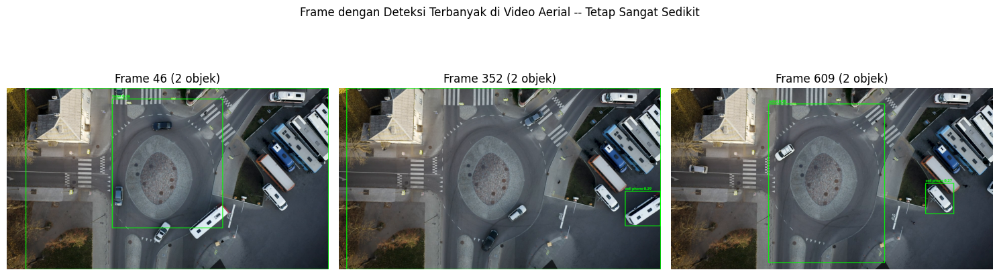

In [30]:
hasil_aerial = proses_video_demo(
    video_url=None,  # sudah diupload manual di Tahap 2
    video_path=AERIAL_VIDEO_PATH,
    compiled_model=compiled_yolo_int8,
    label="aerial",
)

rata2_objek_aerial = np.mean(hasil_aerial["jumlah_objek_per_frame"])
print(f"\nTemuan: rata-rata cuma {rata2_objek_aerial:.2f} objek terdeteksi per frame di video ini,")
print("padahal secara kasat mata ada beberapa mobil dan bus yang terlihat jelas.")
print("Ini bukan bug pada kode -- YOLOv8n (dan mayoritas dataset deteksi objek pada")
print("umumnya) dilatih dari foto dengan sudut pandang normal/miring, bukan sudut tegak")
print("lurus dari drone setinggi ini. Ini contoh nyata domain gap antara data training")
print("dan kondisi penggunaan di lapangan -- hal yang perlu disadari sebelum")
print("menerapkan model semacam ini untuk skenario drone/aerial di dunia nyata.")

tampilkan_momen_terbanyak(
    hasil_aerial["video_path"],
    hasil_aerial["jumlah_objek_per_frame"],
    compiled_yolo_int8,
    judul="Frame dengan Deteksi Terbanyak di Video Aerial -- Tetap Sangat Sedikit",
    n_highlight=3,
)


### Menampilkan Ketiga Video Hasil Secara Langsung

Ketiga video hasil deteksi bisa diputar langsung di sini (Colab maupun Jupyter biasa), lengkap dengan overlay FPS. Sel setelahnya menyediakan tombol untuk mengunduh ketiganya.

In [31]:
from IPython.display import Video, display

print("Video Traffic:")
display(Video(hasil_traffic["output_path"], embed=True, width=640))

print("\nVideo Jalan:")
display(Video(hasil_jalan["output_path"], embed=True, width=640))

print("\nVideo Aerial (uji kasus keterbatasan):")
display(Video(hasil_aerial["output_path"], embed=True, width=640))


Video Traffic:


<Video player output stripped for repository size -- run the notebook in Colab to view inline, or see the sample frames documented in images/>


Video Jalan:


<Video player output stripped for repository size -- run the notebook in Colab to view inline, or see the sample frames documented in images/>


Video Aerial (uji kasus keterbatasan):


<Video player output stripped for repository size -- run the notebook in Colab to view inline, or see the sample frames documented in images/>

In [32]:
# Jalankan sel ini kalau ingin mengunduh ketiga video hasil deteksi langsung ke komputer
# (khusus kalau notebook ini dijalankan di Google Colab)
try:
    from google.colab import files
    files.download(hasil_traffic["output_path"])
    files.download(hasil_jalan["output_path"])
    files.download(hasil_aerial["output_path"])
except ImportError:
    print("Bukan environment Colab, silakan ambil file videonya langsung dari:")
    print(" -", hasil_traffic["output_path"])
    print(" -", hasil_jalan["output_path"])
    print(" -", hasil_aerial["output_path"])


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Penutup

Notebook ini sekarang mencakup keempat topik utama pada materi sesi ini: trade-off ukuran gambar (Tahap 5), multi-threading dan multi-processing (Tahap 7), quantization INT8 (Tahap 3 dan 4), dan optimasi lewat OpenVINO yang dipakai di sepanjang notebook, ditutup dengan demo video (Tahap 9). Setiap klaim angka pada notebook ini didapat langsung dari eksekusi kode di atas, bukan estimasi atau asumsi, sehingga hasilnya wajar jika berbeda sedikit tergantung environment saat dijalankan ulang.

---

*Materi berdasarkan kurikulum CV Super Class, rubythalib.ai.*